# How far are we from solving the 2D & 3D Face Alignment problem? (and a dataset of 230,000 3D facial landmarks)

### : AdaptiveWingLoss 및 여러 연구에서 랜드마크 생성시 사용하는 방법
### 1. 라이브러리 다운이 되지 않아 직접 다운로드 하는 과정을 거침
### 2. 랜드마크 예측 시 좌표로 저장되어 이미지에 시각화하는 코드 구현

Paper : https://openaccess.thecvf.com/content_ICCV_2017/papers/Bulat_How_Far_Are_ICCV_2017_paper.pdf <br>
Github : https://github.com/1adrianb/2D-and-3D-face-alignment, https://github.com/1adrianb/face-alignment(newest) <br>
Revised code writer : Jeongin Lee <br>
Dataset : 

In [9]:
import numpy as np
import cv2, dlib
from matplotlib import pyplot as plt
import os

# 1. 논문이 구현된 라이브러리 다운로드

* pip 설치 오류로 다음과 같은 순서로 진행
1. git clone https://github.com/1adrianb/face-alignment
2. install opencv-python, scipy, sckit-image, numba
3. python setup.py install

In [1]:
import face_alignment
from skimage import io

fa = face_alignment.FaceAlignment(face_alignment.LandmarksType._2D, flip_input=False)


Downloading: "https://www.adrianbulat.com/downloads/python-fan/s3fd-619a316812.pth" to /home/jeongiin/.cache/torch/hub/checkpoints/s3fd-619a316812.pth


  0%|          | 0.00/85.7M [00:00<?, ?B/s]

Downloading: "https://www.adrianbulat.com/downloads/python-fan/2DFAN4-cd938726ad.zip" to /home/jeongiin/.cache/torch/hub/checkpoints/2DFAN4-cd938726ad.zip


  0%|          | 0.00/91.9M [00:00<?, ?B/s]

# 2. Landmark 적용할 폴더 이미지 List 불러오기

In [4]:
img_list = os.listdir('./09000')

In [7]:
input = io.imread('./09000/'+img_list[0])
preds = fa.get_landmarks(input)

In [24]:
img_list.sort()

# 3. Landmark 예측하여 preds에 저장

In [40]:
preds =[]

for i in range(len(img_list)):
    input = io.imread('./09000/'+img_list[i])
    preds.append(fa.get_landmarks(input))

In [41]:
preds

[[array([[268., 502.],
         [268., 581.],
         [278., 651.],
         [288., 701.],
         [318., 771.],
         [358., 811.],
         [388., 831.],
         [438., 851.],
         [517., 881.],
         [607., 861.],
         [697., 831.],
         [767., 801.],
         [817., 751.],
         [856., 681.],
         [876., 611.],
         [886., 542.],
         [896., 462.],
         [288., 412.],
         [308., 402.],
         [348., 392.],
         [388., 392.],
         [418., 402.],
         [567., 402.],
         [597., 392.],
         [647., 382.],
         [707., 382.],
         [757., 412.],
         [487., 482.],
         [478., 532.],
         [468., 571.],
         [468., 611.],
         [448., 641.],
         [458., 651.],
         [487., 651.],
         [517., 651.],
         [537., 641.],
         [338., 472.],
         [358., 462.],
         [398., 462.],
         [428., 482.],
         [398., 492.],
         [358., 492.],
         [587., 482.],
         [6

In [36]:
len(preds[1][0]) # 68개의 랜드마크 사용

68

In [38]:
preds[0][0][1] # 저장 형식 출력

array([268., 502.], dtype=float32)

# 4. 예측된 좌표값을 실제 이미지에 시각화

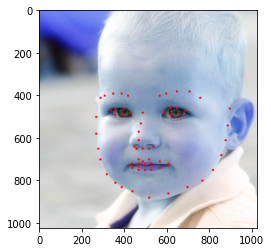

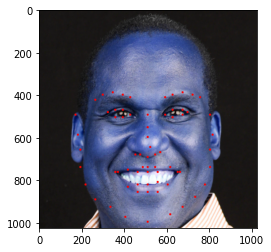

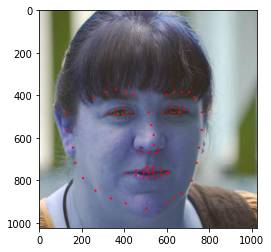

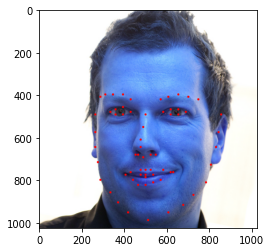

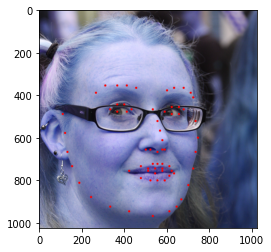

...

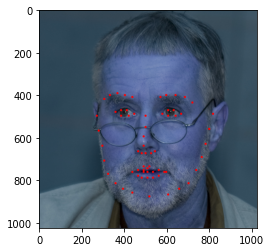

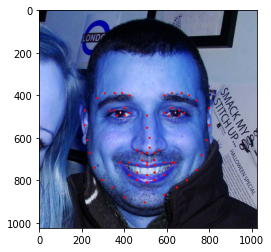

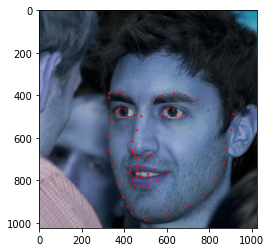

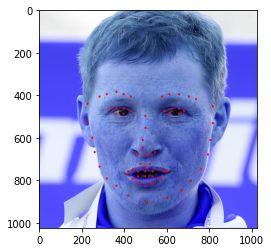

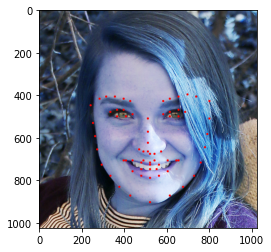

In [42]:
for i in range(len(preds)):
    img = cv2.imread('./09000/'+img_list[i])
    for j in range(len(preds[i][0])):
        point = preds[i][0][j]
        cv2.circle(img, (round(point[0]), round(point[1])),5,(255,0,0),-1)
        
    plt.imshow(img)
    plt.show()
    
